### Introduction
We are classifying different architectural styles based on their visual appearance. Our dataset will be images of buildings with different architectural styles. This model can be applicable in several scenarios; for instance, tourists can take photos of a building on the road and get its architectural style in real time. Specifically, this model is designed to recognize architectural styles from different historical eras or different architects' designs.  

We are planning to use supervised learning with a convolutional neural network. We’ll first determine iconic architectural styles in history and scrape the dataset accordingly from the internet. Then, we’ll define our model class based on the number of classes and features, choosing the most compatible convolutional neural network and defining our objective and optimizer according to the model we employed. Finally, we’ll yield a predictive model.

In [18]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory

cudnn.benchmark = True
plt.ion()   # interactive mode

### Load Data  

Calculate our own mean and std

In [19]:
import torchvision.transforms as tt
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

train = ImageFolder("./dataset-lite-augumented", transform = tt.Compose([
    tt.Resize(224),
    tt.RandomCrop(224),
    tt.ToTensor(),
]))
train_dl = DataLoader(train, 32, shuffle=True, num_workers=2, pin_memory=True)

def get_mean_std(dl):
    sum_, squared_sum, batches = 0,0,0
    for data, _ in dl:
        sum_ += torch.mean(data, dim = ([0,2,3]))
        squared_sum += torch.mean(data**2, dim = ([0,2,3]))
        batches += 1
        
    mean = sum_/batches
    std = (squared_sum/batches - mean**2)**0.5
    return mean,std

mean, std = get_mean_std(train_dl)
mean, std
#(tensor([0.5087, 0.5157, 0.5085]), tensor([0.2603, 0.2459, 0.2859]))

(tensor([0.5093, 0.5161, 0.5090]), tensor([0.2603, 0.2459, 0.2858]))

In [20]:
# Data augmentation and normalization for training
# Just normalization for validation

from torch.utils.data import random_split

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
    'val': transforms.Compose([
        transforms.Resize(24),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
}

data_dir = './dataset-lite-augumented'

all_dataset = datasets.ImageFolder(data_dir, transform=data_transforms['train'] )

# Split the dataset into training and validation sets
train_size = int(0.8 * len(all_dataset))
val_size = len(all_dataset) - train_size
train_dataset, val_dataset = random_split(all_dataset, [train_size, val_size])

# Create data loaders for training and validation sets
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

dataloaders = {'train': train_loader, 'val': val_loader}

# Calculate dataset sizes and get class names
dataset_sizes = {'train': len(train_dataset), 'val': len(val_dataset)}
class_names = all_dataset.classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

### Visualize a few images
Let's visualize a few training images so as to understand the data
augmentations.



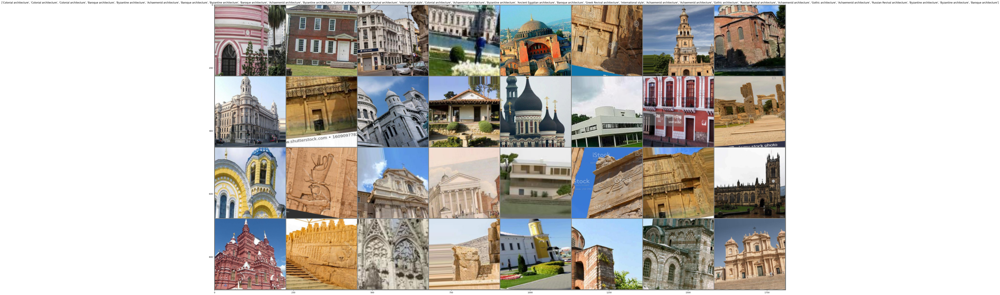

In [21]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    # Set plot figure size
    plt.figure(figsize=(50,50))
    inp = inp.numpy().transpose((1, 2, 0))
    mean1 = np.array(mean)
    std1 = np.array(std)
    inp = std1 * inp + mean1
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

## Training the model

In [22]:
train_loss = []
train_acc = []
val_loss = []
val_acc = []

def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    # Create a temporary directory to save training checkpoints
    with TemporaryDirectory() as tempdir:
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')
    
        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0

        for epoch in range(num_epochs):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0

                # Iterate over data.
                for inputs, labels in dataloaders[phase]:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    # track history if only in train
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)
                if phase == 'train':
                    scheduler.step()

                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

                if phase == 'train':
                    train_loss.append(epoch_loss)
                    train_acc.append(epoch_acc.cpu())
                else:
                    val_loss.append(epoch_loss)
                    val_acc.append(epoch_acc.cpu())

                # deep copy the model
                if phase == 'val' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    torch.save(model.state_dict(), best_model_params_path)
                    torch.save(model.state_dict(), 'transferred_best_model.pth')
                    print(f'Best val Acc: {best_acc:4f}')

            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        print(f'Best val Acc: {best_acc:4f}')

        # load best model weights
        model.load_state_dict(torch.load(best_model_params_path))
    return model

### Visualize Training Results

In [23]:
def visualize_trining_results(train_loss, train_acc, val_loss, val_acc):
    # Visualize training and validation loss
    plt.figure(figsize=(10, 7))
    plt.plot(np.array(train_loss), color='blue', label='train loss')
    plt.plot(np.array(val_loss), color='red', label='val loss')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.show()

    # Visualize training and validation accuracy
    plt.figure(figsize=(10, 7))
    plt.plot(np.array(train_acc), color='blue', label='train accuracy')
    plt.plot(np.array(val_acc), color='red', label='val accuracy')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.show()

### Visualizing the model predictions

Generic function to display predictions for a few images




In [24]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

## Finetuning

Load a pretrained model and reset final fully connected layer.




In [25]:
model_ft = models.resnet18(weights='IMAGENET1K_V1')
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to ``nn.Linear(num_ftrs, len(class_names))``.
model_ft.fc = nn.Linear(num_ftrs, len(class_names))

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

### Train and evaluate




In [26]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=25)

Epoch 0/24
----------
train Loss: 1.0469 Acc: 0.6450
val Loss: 0.5868 Acc: 0.7999
Best val Acc: 0.799901

Epoch 1/24
----------
train Loss: 0.5789 Acc: 0.8057
val Loss: 0.4446 Acc: 0.8500
Best val Acc: 0.850050

Epoch 2/24
----------
train Loss: 0.4491 Acc: 0.8490
val Loss: 0.3747 Acc: 0.8754
Best val Acc: 0.875372

Epoch 3/24
----------
train Loss: 0.3935 Acc: 0.8700
val Loss: 0.3443 Acc: 0.8878
Best val Acc: 0.887786

Epoch 4/24
----------
train Loss: 0.3310 Acc: 0.8880
val Loss: 0.3114 Acc: 0.8918
Best val Acc: 0.891758

Epoch 5/24
----------
train Loss: 0.2947 Acc: 0.9033
val Loss: 0.2611 Acc: 0.9181
Best val Acc: 0.918073

Epoch 6/24
----------
train Loss: 0.2561 Acc: 0.9142
val Loss: 0.2146 Acc: 0.9280
Best val Acc: 0.928004

Epoch 7/24
----------
train Loss: 0.2241 Acc: 0.9290
val Loss: 0.2079 Acc: 0.9310
Best val Acc: 0.930983

Epoch 8/24
----------
train Loss: 0.2112 Acc: 0.9321
val Loss: 0.2063 Acc: 0.9305

Epoch 9/24
----------
train Loss: 0.2111 Acc: 0.9361
val Loss: 0.2110

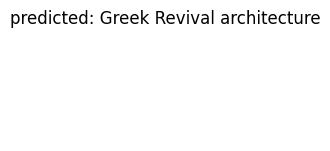

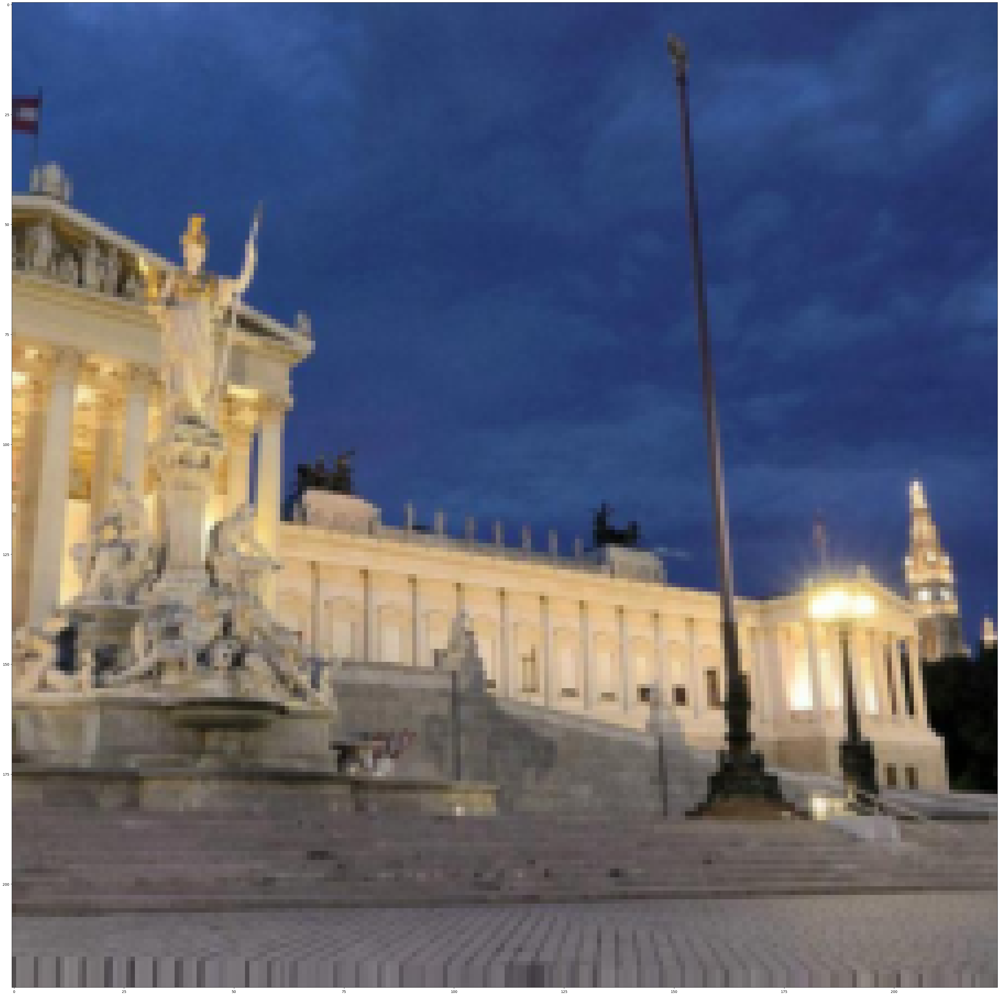

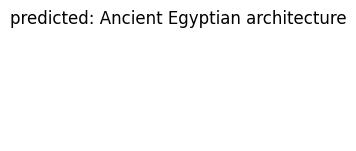

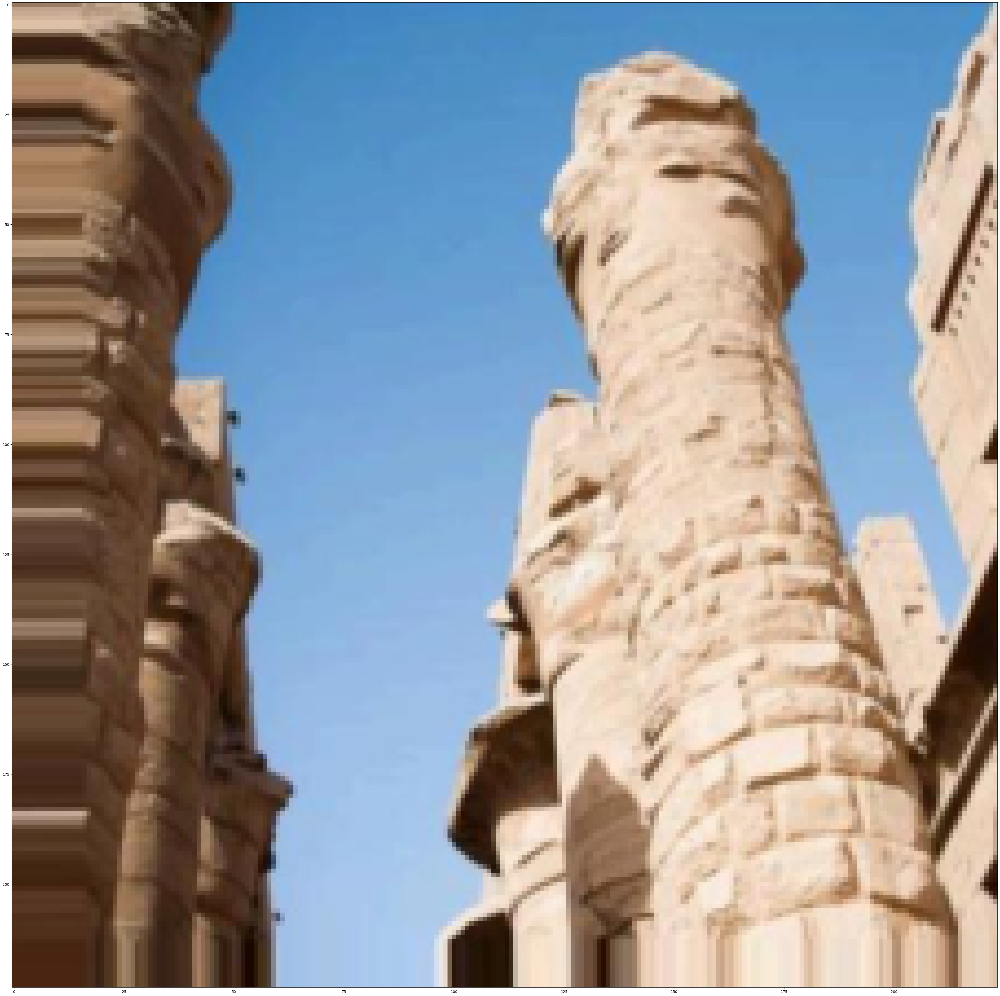

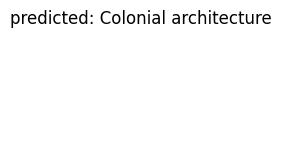

...

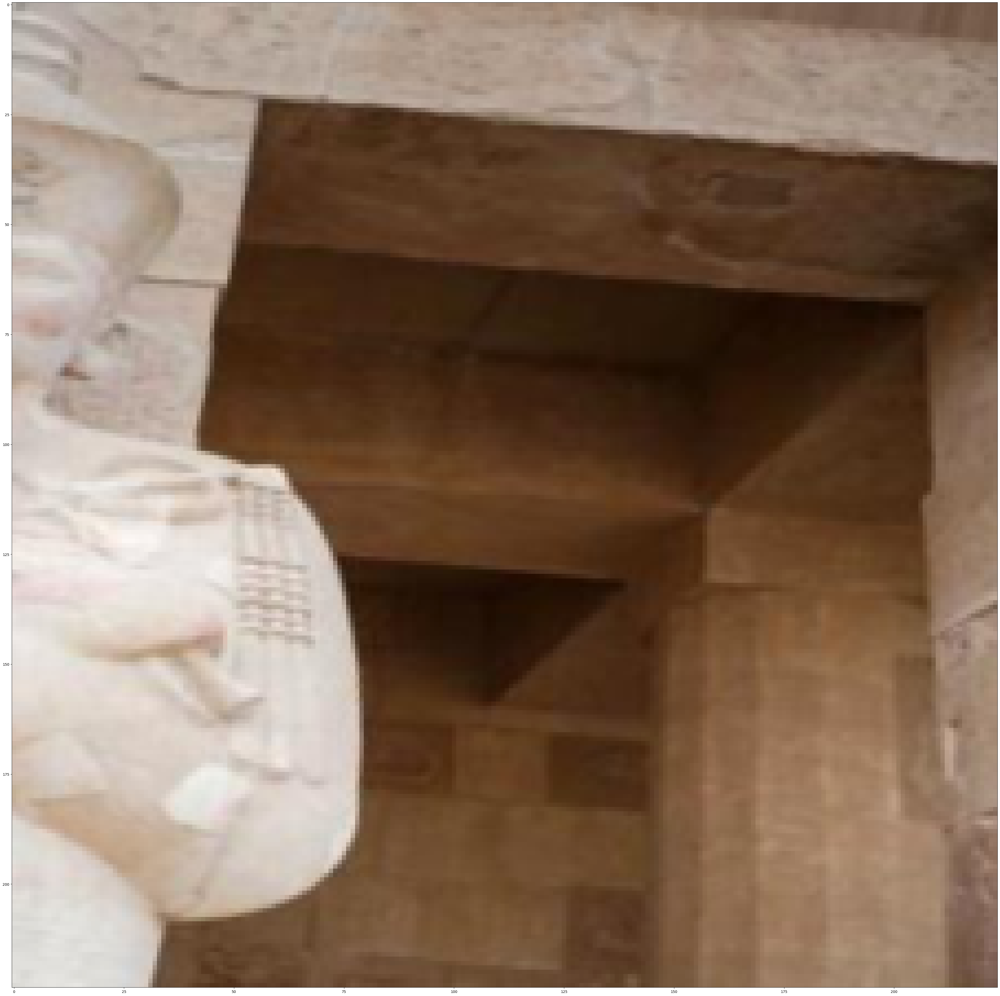

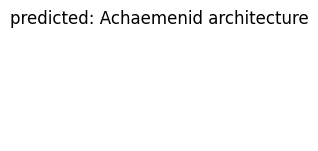

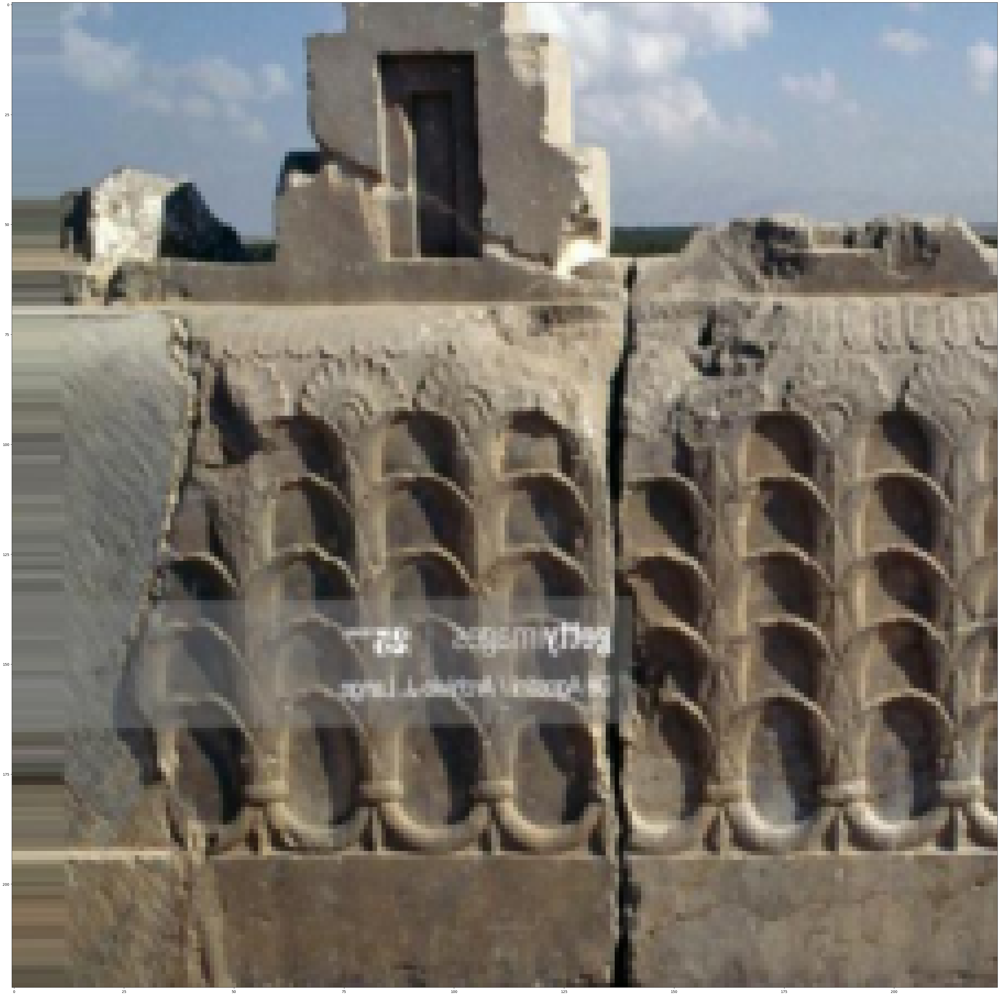

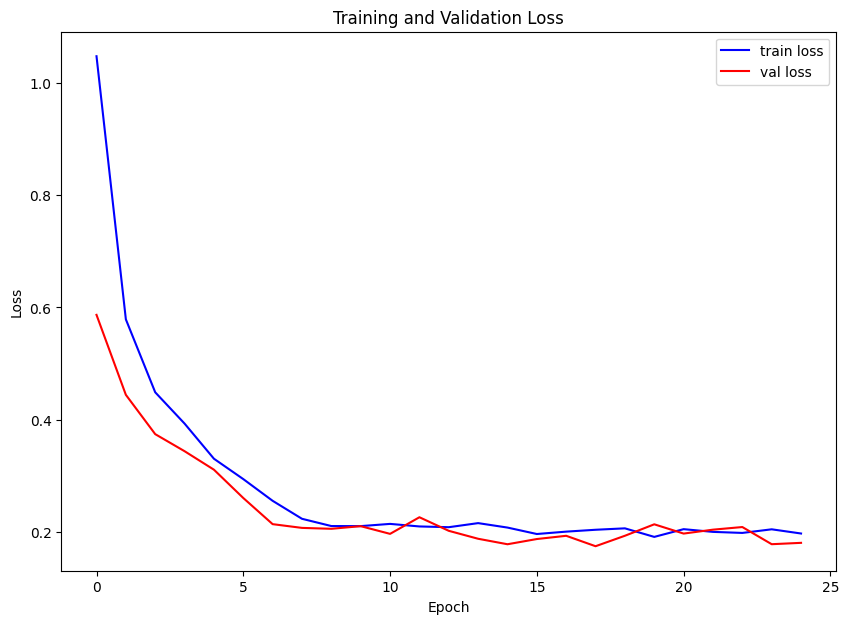

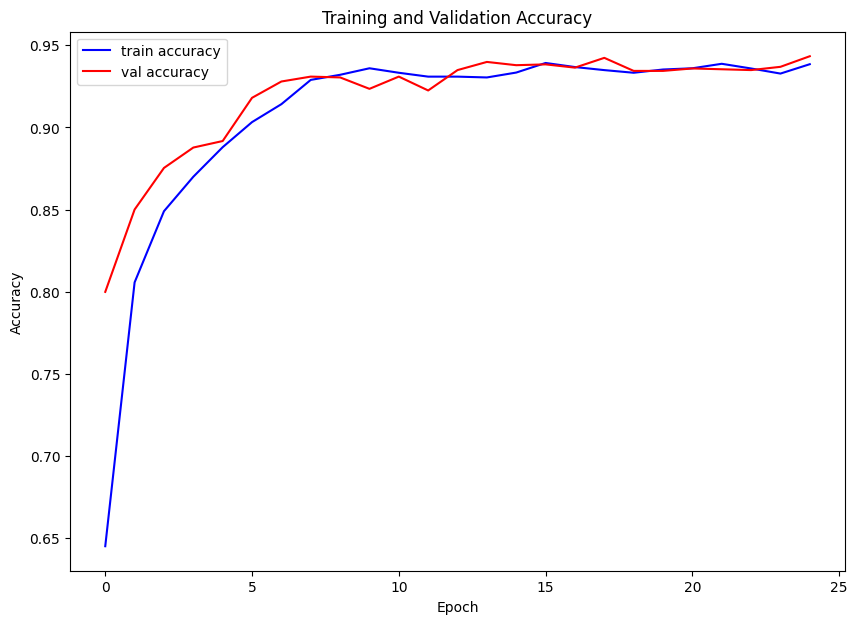

In [27]:
visualize_model(model_ft)
visualize_trining_results(train_loss, train_acc, val_loss, val_acc)

## Inference on custom images

Use the trained model to make predictions on custom images and visualize
the predicted class labels along with the images.




In [28]:
def visualize_model_predictions(model,img_path):
    was_training = model.training
    model.eval()

    img = Image.open(img_path)
    img = data_transforms['val'](img)
    img = img.unsqueeze(0)
    img = img.to(device)

    with torch.no_grad():
        outputs = model(img)
        _, preds = torch.max(outputs, 1)

        ax = plt.subplot(2,2,1)
        ax.axis('off')
        ax.set_title(f'Predicted: {class_names[preds[0]]}')
        imshow(img.cpu().data[0])
        
        model.train(mode=was_training)

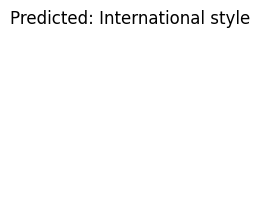

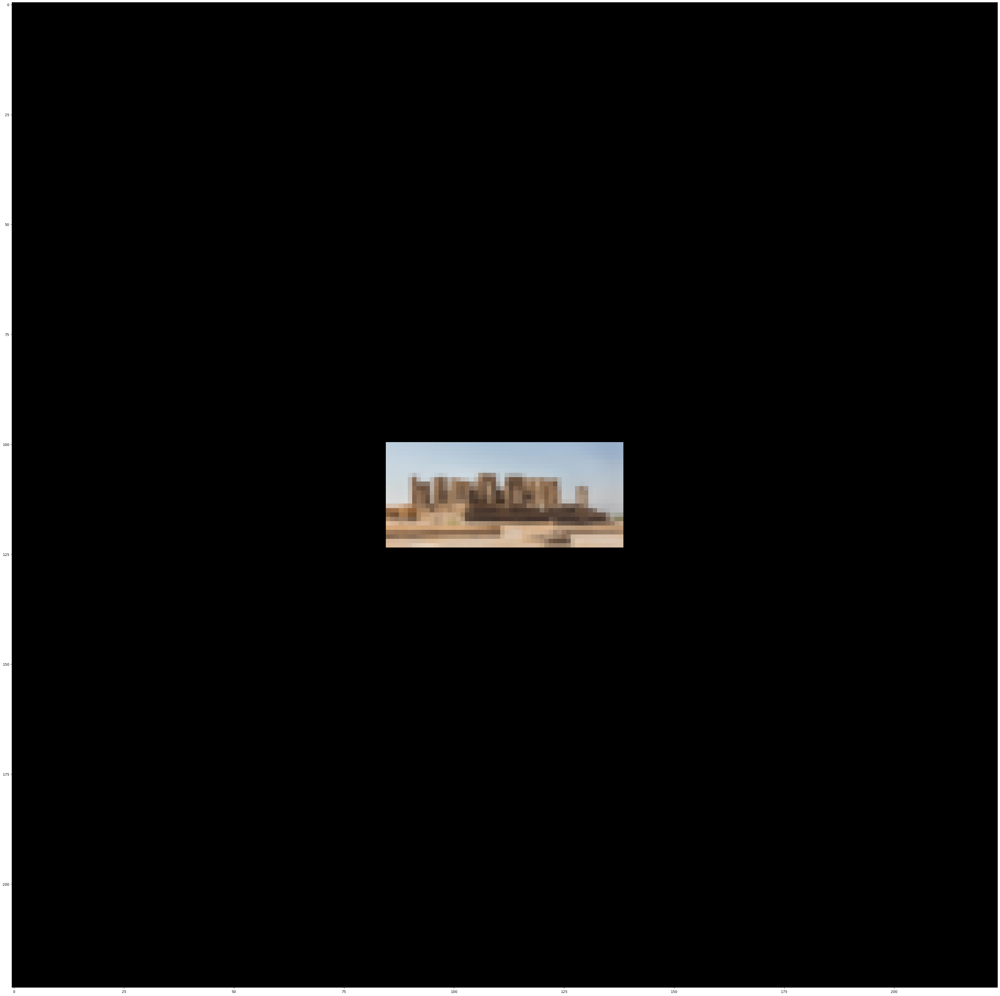

In [29]:
visualize_model_predictions(
    model_ft,
    img_path='dataset-lite/Achaemenid architecture/000000.jpg'
)

plt.ioff()
plt.show()